# Monolingual



In [ ]:
# prompt: Read desc.xlsx with pandas

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming desc.xlsx is in the current working directory.
# If not, provide the full path to the file.
try:
  df = pd.read_excel('desc.xlsx')
  print(df.head()) # Display the first few rows of the DataFrame
except FileNotFoundError:
  print("Error: desc.xlsx not found. Please ensure the file exists in the current directory or provide the correct path.")
except Exception as e:
  print(f"An error occurred: {e}")


                                            question  answer  \
0    do iran and afghanistan speak the same language    True   
1  do good samaritan laws protect those who help ...    True   
2  is windows movie maker part of windows essentials    True   
3  is confectionary sugar the same as powdered sugar    True   
4         is elder scrolls online the same as skyrim   False   

   llama-3.2-1B-true-first  llama-3.2-1B-false-first  Phi-3.5-mini-true-first  \
0                 0.632886                  0.396435                 0.043199   
1                 0.714372                  0.418379                 0.960409   
2                 0.699358                  0.513565                 0.927759   
3                 0.673370                  0.504243                 0.976338   
4                 0.664315                  0.517016                 0.107662   

   Phi-3.5-mini-false-first  Mistral-7B-true-first  Mistral-7B-false-first  \
0                  0.013078               0.903784

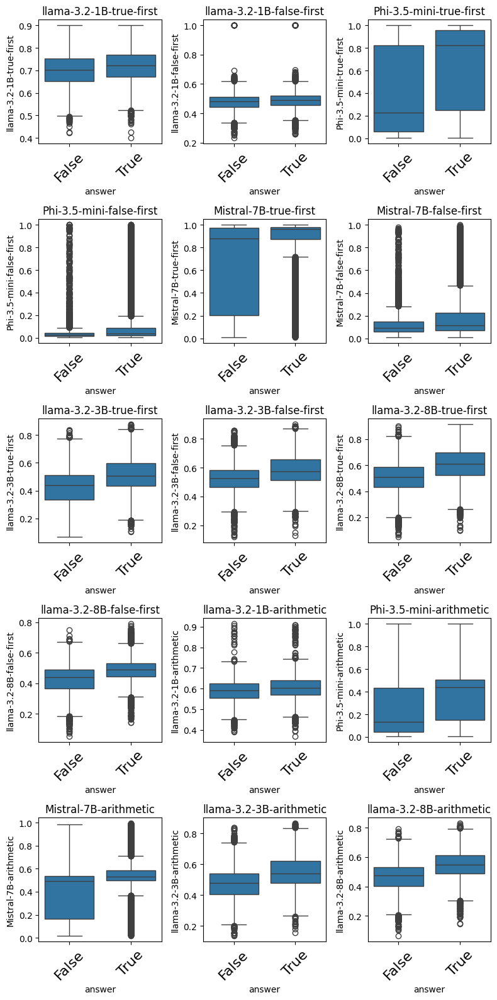

In [ ]:
# prompt: generate a boxplot for numerical variables with df["answer"] as a hue. Do it in one figure. Solve "ValueError: num must be an integer with 1 <= num <= 6, not 7".



# Assuming 'df' is already defined and contains the data from 'desc.xlsx'.

# Select numerical columns for the boxplot
numerical_cols = df.select_dtypes(include=['number']).columns

# Create the boxplot using seaborn for better hue handling
plt.figure(figsize=(8, 16))  # Adjust figure size as needed

for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols) // 3 + (len(numerical_cols) % 3 > 0), 3, i + 1)
    sns.boxplot(x='answer', y=col, data=df)
    plt.title(col)
    plt.xticks(rotation=45, fontsize=16)

plt.tight_layout()  # Adjust subplot parameters for a tight layout
plt.savefig(f"figure_1_boxplot_models_per_answer.png")
plt.show()

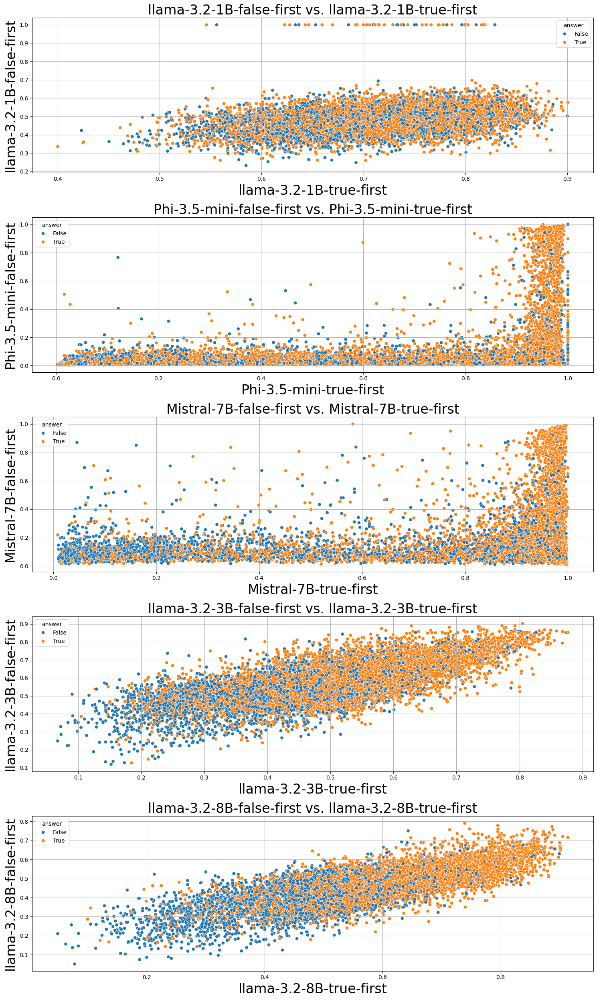

In [35]:
# prompt: Trace the scatter plot of df[x+"_false_first"] in function of df[x+"_true_first"]. Show the plots in one figure with subplots. Use df["answer"] as a hue.

# Assuming 'df' is already defined and contains the data from 'desc.xlsx'.

# List of columns to plot (replace with your actual column names)
columns_to_plot = ["llama-3.2-1B", "Phi-3.5-mini", "Mistral-7B", "llama-3.2-3B", "llama-3.2-8B"] # Example: Replace with your columns

plt.figure(figsize=(15, 5 * len(columns_to_plot)))  # Adjust figure size as needed

for i, x in enumerate(columns_to_plot):
    plt.subplot(len(columns_to_plot), 1, i + 1)
    sns.scatterplot(x=x + "-true-first", y=x + "-false-first", hue="answer", data=df)
    plt.xlabel(x + "-true-first", fontsize=24)
    plt.ylabel(x + "-false-first", fontsize=24)
    plt.title(f'{x}-false-first vs. {x}-true-first', fontsize=24)
    plt.grid(True)

plt.tight_layout()
plt.savefig(f"figure_2_scatter_by_answer.png")
plt.show()

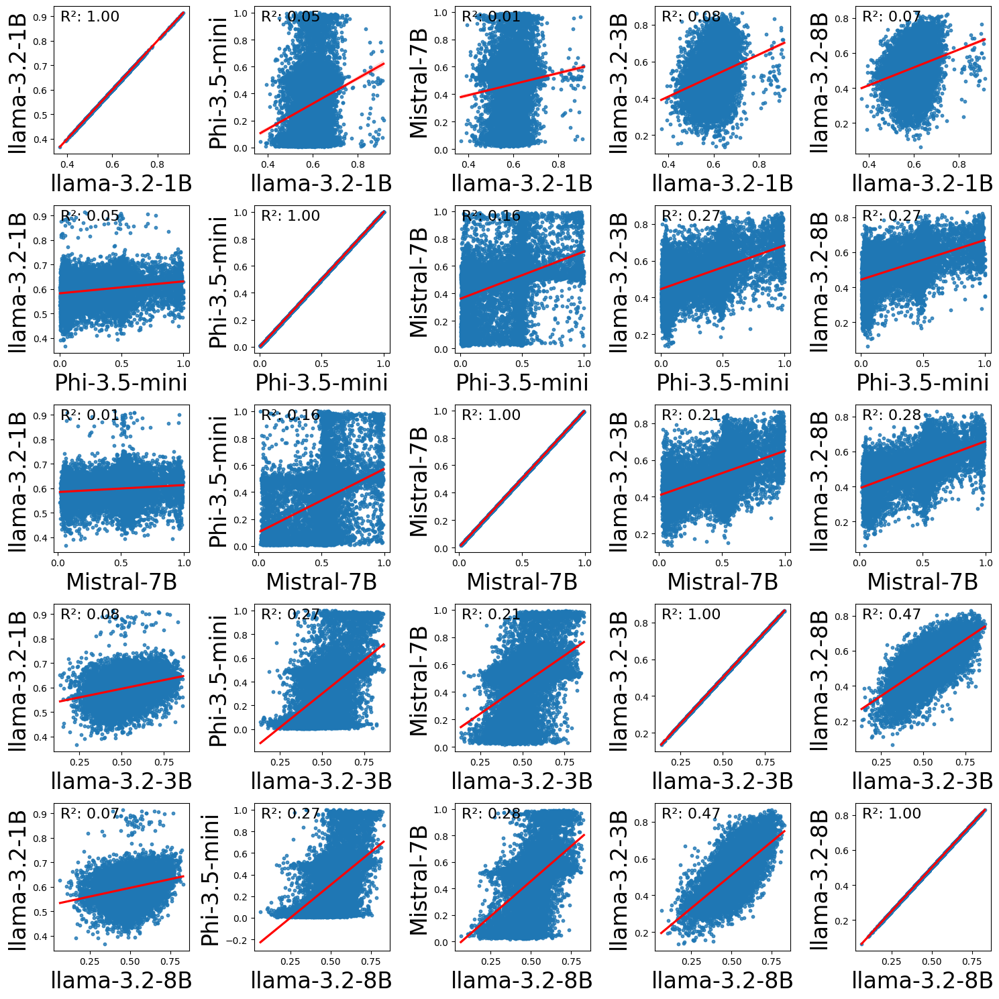

In [30]:
# prompt: Trace the correlations between all df[X+"arithmetic"] with R-Squared values. Provide all figures as subplots of one plot.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Assuming 'df' is already defined and contains the data from 'desc.xlsx'.

# Identify columns ending with "arithmetic"
arithmetic_cols = [col for col in df.columns if col.endswith("arithmetic")]

# Create a figure and axes for subplots
fig, axes = plt.subplots(len(arithmetic_cols), len(arithmetic_cols), figsize=(15, 15))

# Iterate through all pairs of arithmetic columns
for i, col1 in enumerate(arithmetic_cols):
    for j, col2 in enumerate(arithmetic_cols):
        # Calculate the Pearson correlation coefficient and R-squared value
        correlation, p_value = pearsonr(df[col1], df[col2])
        r_squared = correlation**2

        # Create the scatter plot
        sns.regplot(x=col1, y=col2, data=df, ax=axes[i, j], scatter_kws={'s': 10}, line_kws={"color": "red"})

        # Add text with R-squared value
        axes[i, j].text(0.05, 0.9, f"R²: {r_squared:.2f}", transform=axes[i, j].transAxes, fontsize=16)

        # Set labels and title
        axes[i,j].set_xlabel(col1[:-11], fontsize=24)
        axes[i,j].set_ylabel(col2[:-11], fontsize=24)

plt.tight_layout()
plt.savefig(f"figure_3_regplot_models.png")
plt.show()

# Multilingual

## Phi-3.5-mini

In [ ]:
# prompt: Read desc.xlsx with pandas

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming desc.xlsx is in the current working directory.
# If not, provide the full path to the file.
try:
  df_phi = pd.read_excel('desc-phi.xlsx')
  print(df_phi.head()) # Display the first few rows of the DataFrame
except FileNotFoundError:
  print("Error: desc.xlsx not found. Please ensure the file exists in the current directory or provide the correct path.")
except Exception as e:
  print(f"An error occurred: {e}")

                                            question  answer  \
0    do iran and afghanistan speak the same language    True   
1  do good samaritan laws protect those who help ...    True   
2  is windows movie maker part of windows essentials    True   
3  is confectionary sugar the same as powdered sugar    True   
4         is elder scrolls online the same as skyrim   False   

                                           afrikaans  \
0           praat Iran en Afghanistan dieselfde taal   
1  beskerm goeie samaritaanse wette diegene wat b...   
2  is windows movie maker deel van windows essent...   
3        is soetgoedsuiker dieselfde as poeiersuiker   
4      is ouderling rolle aanlyn dieselfde as skyrim   

                                              german  \
0    Sprechen Iran und Afghanistan dieselbe Sprache?   
1  Tue barmherzige Samaritergesetze, die diejenig...   
2  ist Windows Movie Maker Teil von Windows Essen...   
3           ist Puderzucker dasselbe wie Puderzucker  

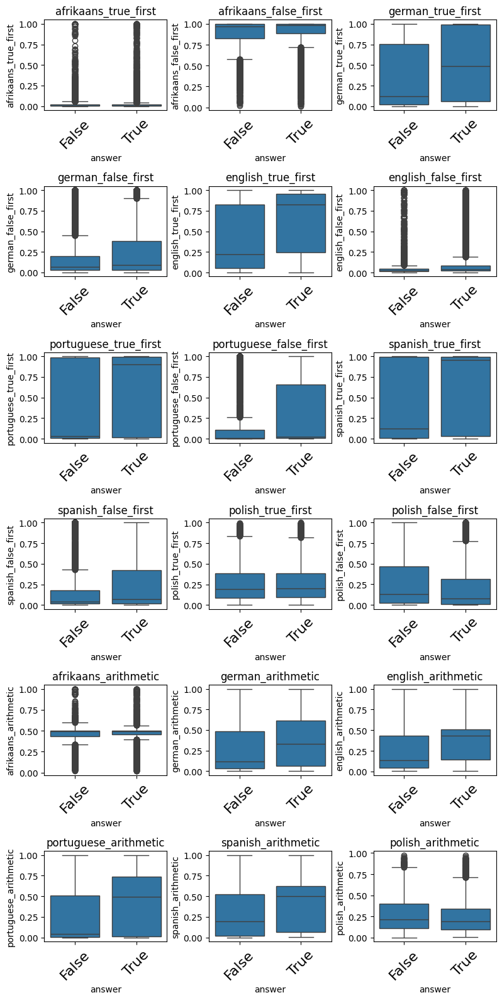

In [ ]:
# prompt: generate a boxplot for numerical variables with df["answer"] as a hue. Do it in one figure. Solve "ValueError: num must be an integer with 1 <= num <= 6, not 7".



# Assuming 'df' is already defined and contains the data from 'desc.xlsx'.

# Select numerical columns for the boxplot
numerical_cols = df_phi.select_dtypes(include=['number']).columns

# Create the boxplot using seaborn for better hue handling
plt.figure(figsize=(8, 16))  # Adjust figure size as needed

for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols) // 3 + (len(numerical_cols) % 3 > 0), 3, i + 1)
    sns.boxplot(x='answer', y=col, data=df_phi)
    plt.title(col)
    plt.xticks(rotation=45, fontsize=16)

plt.tight_layout()  # Adjust subplot parameters for a tight layout
plt.savefig(f"figure_4_boxplot_multilingual_phi_per_answer.png")
plt.show()

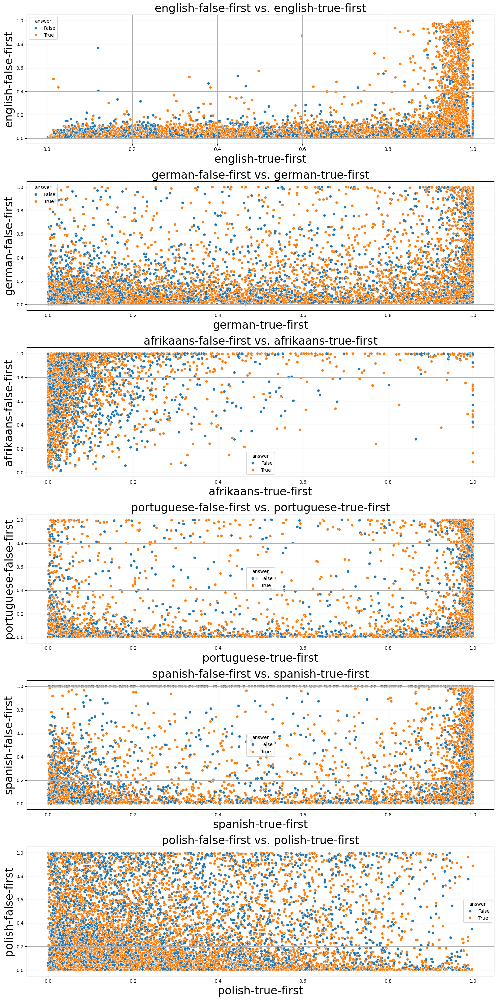

In [34]:
# prompt: Trace the scatter plot of df[x+"_false_first"] in function of df[x+"_true_first"]. Show the plots in one figure with subplots. Use df["answer"] as a hue.

# Assuming 'df' is already defined and contains the data from 'desc.xlsx'.

# List of columns to plot (replace with your actual column names)
columns_to_plot = ["english", "german", "afrikaans", "portuguese", "spanish", "polish"] # Example: Replace with your columns

plt.figure(figsize=(15, 5 * len(columns_to_plot)))  # Adjust figure size as needed

for i, x in enumerate(columns_to_plot):
    plt.subplot(len(columns_to_plot), 1, i + 1)
    sns.scatterplot(x=x + "_true_first", y=x + "_false_first", hue="answer", data=df_phi)
    plt.xlabel(x + "-true-first", fontsize=24)
    plt.ylabel(x + "-false-first", fontsize=24)
    plt.title(f'{x}-false-first vs. {x}-true-first', fontsize=24)
    plt.grid(True)

plt.tight_layout()
plt.savefig(f"figure_5_scatter_multilingual_phi_per_answer.png")
plt.show()

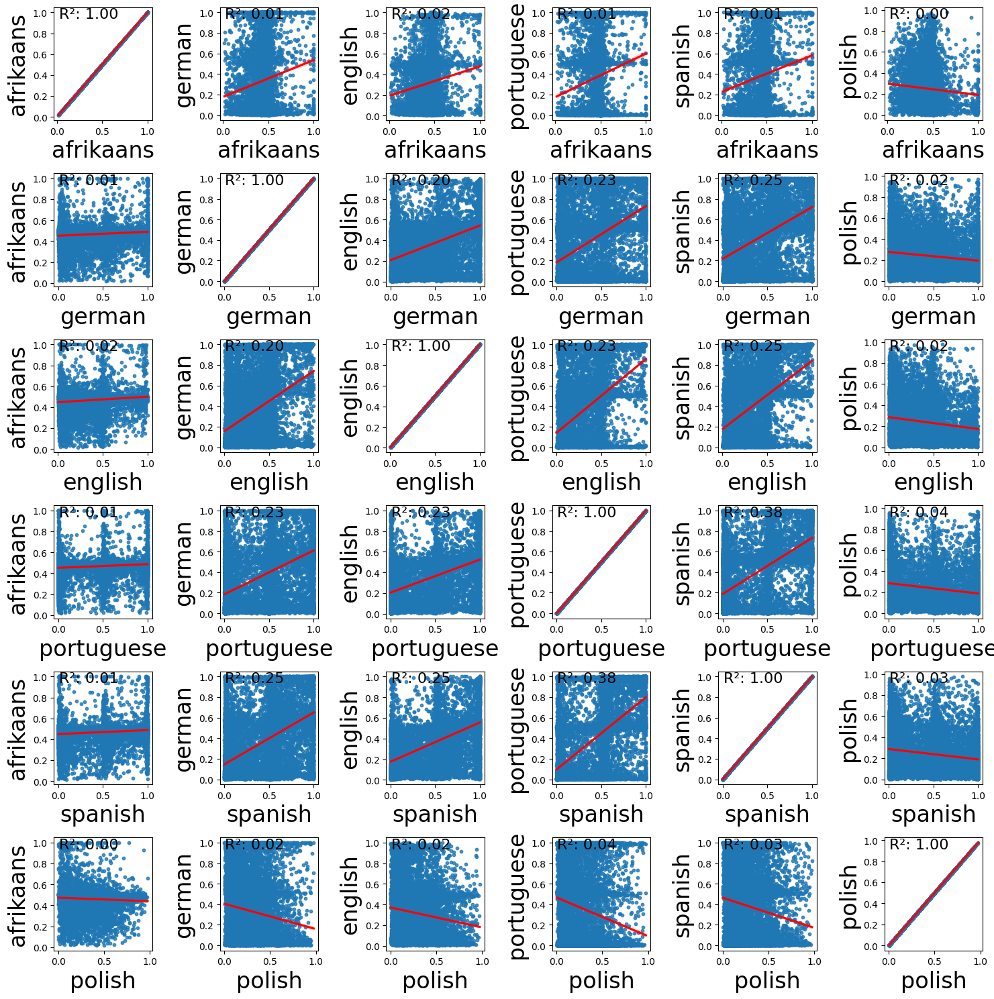

In [31]:
# prompt: Trace the correlations between all df[X+"arithmetic"] with R-Squared values. Provide all figures as subplots of one plot.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Assuming 'df' is already defined and contains the data from 'desc.xlsx'.

# Identify columns ending with "arithmetic"
arithmetic_cols = [col for col in df_phi.columns if col.endswith("arithmetic")]

# Create a figure and axes for subplots
fig, axes = plt.subplots(len(arithmetic_cols), len(arithmetic_cols), figsize=(15, 15))

# Iterate through all pairs of arithmetic columns
for i, col1 in enumerate(arithmetic_cols):
    for j, col2 in enumerate(arithmetic_cols):
        # Calculate the Pearson correlation coefficient and R-squared value
        correlation, p_value = pearsonr(df_phi[col1], df_phi[col2])
        r_squared = correlation**2

        # Create the scatter plot
        sns.regplot(x=col1, y=col2, data=df_phi, ax=axes[i, j], scatter_kws={'s': 10}, line_kws={"color": "red"})

        # Add text with R-squared value
        axes[i, j].text(0.05, 0.9, f"R²: {r_squared:.2f}", transform=axes[i, j].transAxes, fontsize=16)

        # Set labels and title
        axes[i,j].set_xlabel(col1[:-11], fontsize=24)
        axes[i,j].set_ylabel(col2[:-11], fontsize=24)

plt.tight_layout()
plt.savefig(f"figure_6_regplot_multilingual_phi.png")
plt.show()

## Llama-3.2-3B

In [ ]:
# prompt: Read desc.xlsx with pandas

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming desc.xlsx is in the current working directory.
# If not, provide the full path to the file.
try:
  df_llama = pd.read_excel('desc-llama.xlsx')
  print(df_llama.head()) # Display the first few rows of the DataFrame
except FileNotFoundError:
  print("Error: desc.xlsx not found. Please ensure the file exists in the current directory or provide the correct path.")
except Exception as e:
  print(f"An error occurred: {e}")

                                            question  answer  \
0    do iran and afghanistan speak the same language    True   
1  do good samaritan laws protect those who help ...    True   
2  is windows movie maker part of windows essentials    True   
3  is confectionary sugar the same as powdered sugar    True   
4         is elder scrolls online the same as skyrim   False   

                                           afrikaans  \
0           praat Iran en Afghanistan dieselfde taal   
1  beskerm goeie samaritaanse wette diegene wat b...   
2  is windows movie maker deel van windows essent...   
3        is soetgoedsuiker dieselfde as poeiersuiker   
4      is ouderling rolle aanlyn dieselfde as skyrim   

                                              german  \
0    Sprechen Iran und Afghanistan dieselbe Sprache?   
1  Tue barmherzige Samaritergesetze, die diejenig...   
2  ist Windows Movie Maker Teil von Windows Essen...   
3           ist Puderzucker dasselbe wie Puderzucker  

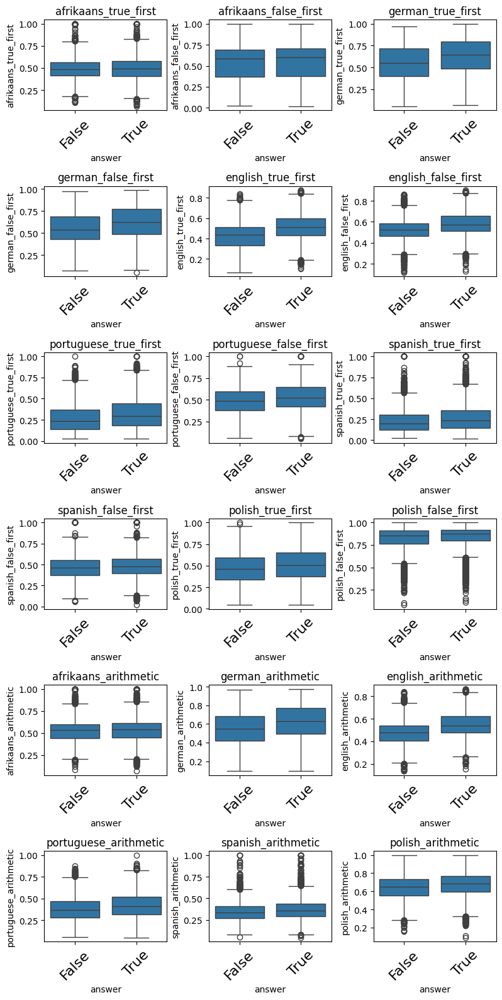

In [ ]:
# prompt: generate a boxplot for numerical variables with df["answer"] as a hue. Do it in one figure. Solve "ValueError: num must be an integer with 1 <= num <= 6, not 7".



# Assuming 'df' is already defined and contains the data from 'desc.xlsx'.

# Select numerical columns for the boxplot
numerical_cols = df_llama.select_dtypes(include=['number']).columns

# Create the boxplot using seaborn for better hue handling
plt.figure(figsize=(8, 16))  # Adjust figure size as needed

for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols) // 3 + (len(numerical_cols) % 3 > 0), 3, i + 1)
    sns.boxplot(x='answer', y=col, data=df_llama)
    plt.title(col)
    plt.xticks(rotation=45, fontsize=16)

plt.tight_layout()  # Adjust subplot parameters for a tight layout
plt.savefig(f"figure_7_boxplot_multilingual_llama_3b_per_answer.png")
plt.show()

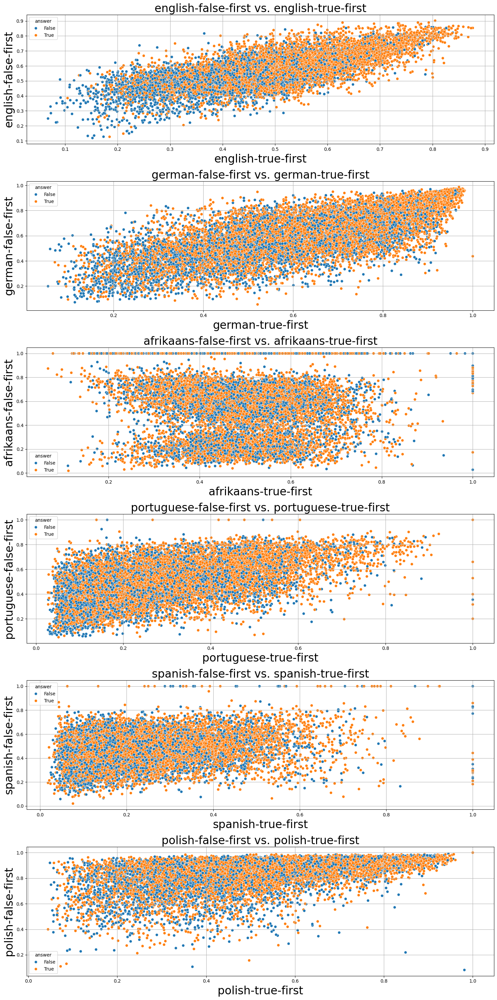

In [33]:
# prompt: Trace the scatter plot of df[x+"_false_first"] in function of df[x+"_true_first"]. Show the plots in one figure with subplots. Use df["answer"] as a hue.

# Assuming 'df' is already defined and contains the data from 'desc.xlsx'.

# List of columns to plot (replace with your actual column names)
columns_to_plot = ["english", "german", "afrikaans", "portuguese", "spanish", "polish"] # Example: Replace with your columns

plt.figure(figsize=(15, 5 * len(columns_to_plot)))  # Adjust figure size as needed

for i, x in enumerate(columns_to_plot):
    plt.subplot(len(columns_to_plot), 1, i + 1)
    sns.scatterplot(x=x + "_true_first", y=x + "_false_first", hue="answer", data=df_llama)
    plt.xlabel(x + "-true-first", fontsize=24)
    plt.ylabel(x + "-false-first", fontsize=24)
    plt.title(f'{x}-false-first vs. {x}-true-first', fontsize=24)
    plt.grid(True)

plt.tight_layout()
plt.savefig(f"figure_8_scatter_multilingual_llama_3b_per_answer.png")
plt.show()

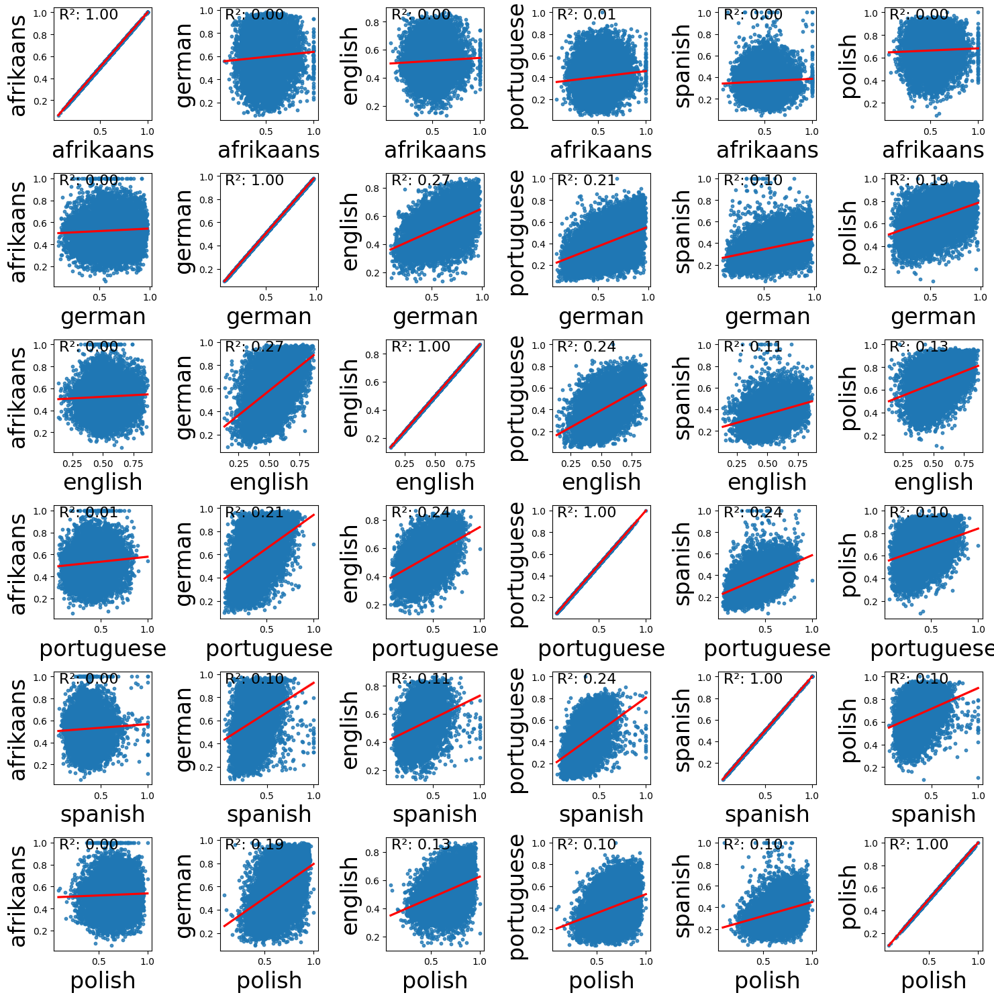

In [32]:
# prompt: Trace the correlations between all df[X+"arithmetic"] with R-Squared values. Provide all figures as subplots of one plot.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Assuming 'df' is already defined and contains the data from 'desc.xlsx'.

# Identify columns ending with "arithmetic"
arithmetic_cols = [col for col in df_llama.columns if col.endswith("arithmetic")]

# Create a figure and axes for subplots
fig, axes = plt.subplots(len(arithmetic_cols), len(arithmetic_cols), figsize=(15, 15))

# Iterate through all pairs of arithmetic columns
for i, col1 in enumerate(arithmetic_cols):
    for j, col2 in enumerate(arithmetic_cols):
        # Calculate the Pearson correlation coefficient and R-squared value
        correlation, p_value = pearsonr(df_llama[col1], df_llama[col2])
        r_squared = correlation**2

        # Create the scatter plot
        sns.regplot(x=col1, y=col2, data=df_llama, ax=axes[i, j], scatter_kws={'s': 10}, line_kws={"color": "red"})

        # Add text with R-squared value
        axes[i, j].text(0.05, 0.9, f"R²: {r_squared:.2f}", transform=axes[i, j].transAxes, fontsize=16)

        # Set labels and title
        axes[i,j].set_xlabel(col1[:-11], fontsize=24)
        axes[i,j].set_ylabel(col2[:-11], fontsize=24)

plt.tight_layout()
plt.savefig(f"figure_9_regplot_multilingual_llama_3b.png")
plt.show()